In [1]:
import os
import urllib.request
import tarfile
import gzip
import shutil

data_dir = "data"
url = "https://raw.githubusercontent.com/ageron/handson-ml2/master/datasets/housing/housing.tgz"
tgz_path = os.path.join(data_dir, "housing.tgz")
csv_path = os.path.join(data_dir, "housing.csv")
gz_path = os.path.join(data_dir, "housing.csv.gz")

# (odpowiednik: mkdir data)
os.makedirs(data_dir, exist_ok=True)

# (odpowiednik: wget ...)
urllib.request.urlretrieve(url, tgz_path)

# (odpowiednik: tar xfz housing.tgz)
with tarfile.open(tgz_path, "r:gz") as tar:
    tar.extractall(path=data_dir)

# (odpowiednik: gzip housing.csv)
with open(csv_path, 'rb') as f_in:
    with gzip.open(gz_path, 'wb') as f_out:
        shutil.copyfileobj(f_in, f_out)
        
# Polecenie 'gzip' w systemie Linux domyślnie usuwa oryginalny plik po kompresji
os.remove(csv_path) 

#(odpowiednik: rm housing.tgz)
os.remove(tgz_path)

#(odpowiednik: zcat data/housing.csv.gz | head -4)
with gzip.open(gz_path, 'rt', encoding='utf-8') as f:
    for i in range(4):
        print(f.readline().strip())

longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY


In [2]:
import pandas as pd
df = pd.read_csv('data/housing.csv.gz')

In [3]:
df.head()
df.info()

<class 'pandas.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  str    
dtypes: float64(9), str(1)
memory usage: 1.6 MB


In [4]:
df['ocean_proximity'].value_counts()
df['ocean_proximity'].describe()

count         20640
unique            5
top       <1H OCEAN
freq           9136
Name: ocean_proximity, dtype: object

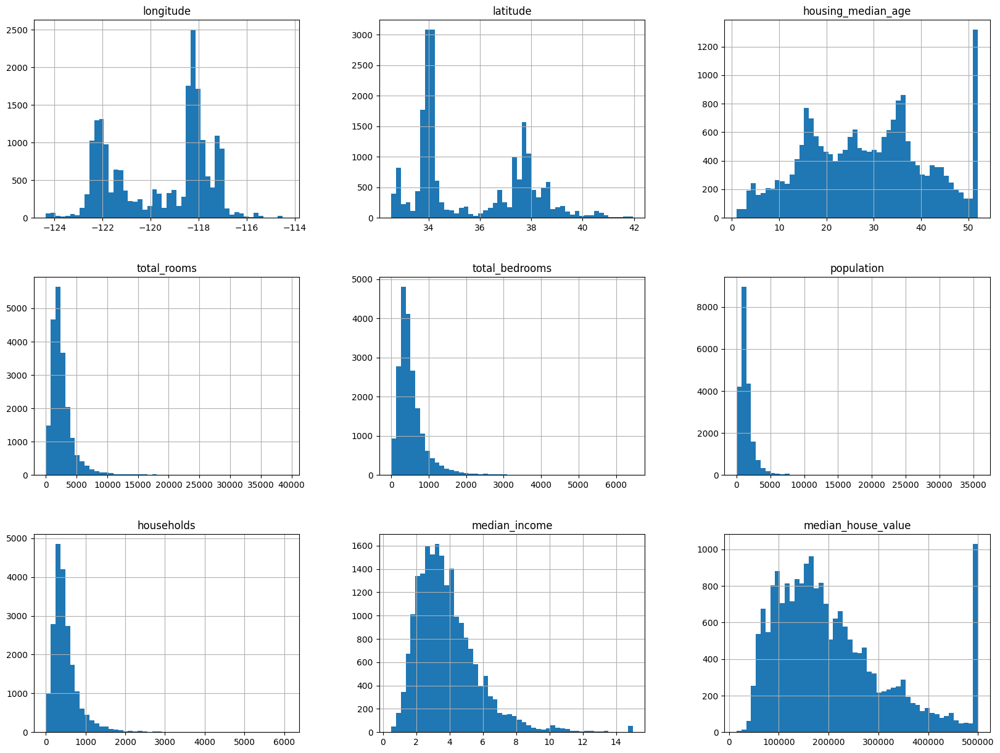

In [5]:
import matplotlib.pyplot as plt
df.hist(bins=50, figsize=(20,15))
plt.savefig("obraz1.png")
plt.show()

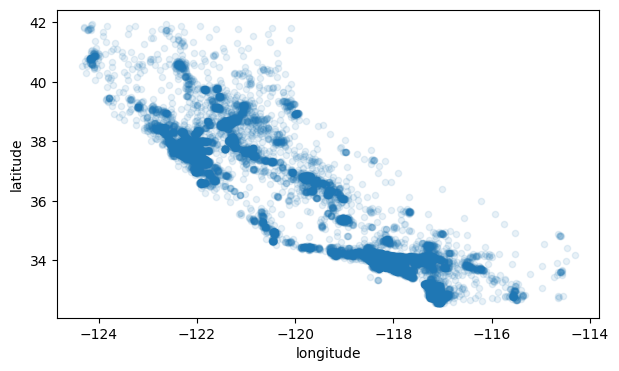

In [6]:
df.plot(kind="scatter", x="longitude", y="latitude", alpha=0.1, figsize=(7,4))
plt.savefig("obraz2.png")
plt.show()

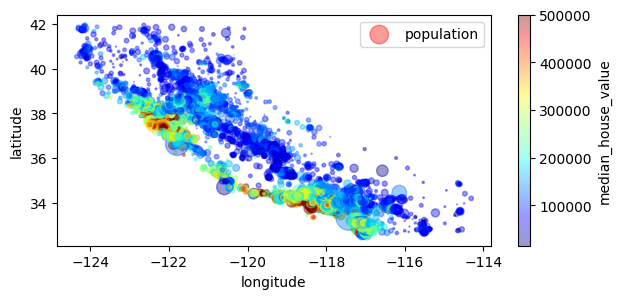

In [7]:
df.plot(kind="scatter", x="longitude", y="latitude", alpha=0.4, figsize=(7,3), colorbar=True, 
        s=df["population"]/100, label="population", c="median_house_value", cmap=plt.get_cmap("jet"))
plt.savefig("obraz3.png")
plt.show()

In [8]:
df.corr(numeric_only=True)["median_house_value"] \
  .sort_values(ascending=False) \
  .reset_index() \
  .rename(columns={"index": "atrybut", "median_house_value": "wspolczynnik_korelacji"}) \
  .to_csv("korelacja.csv", index=False)

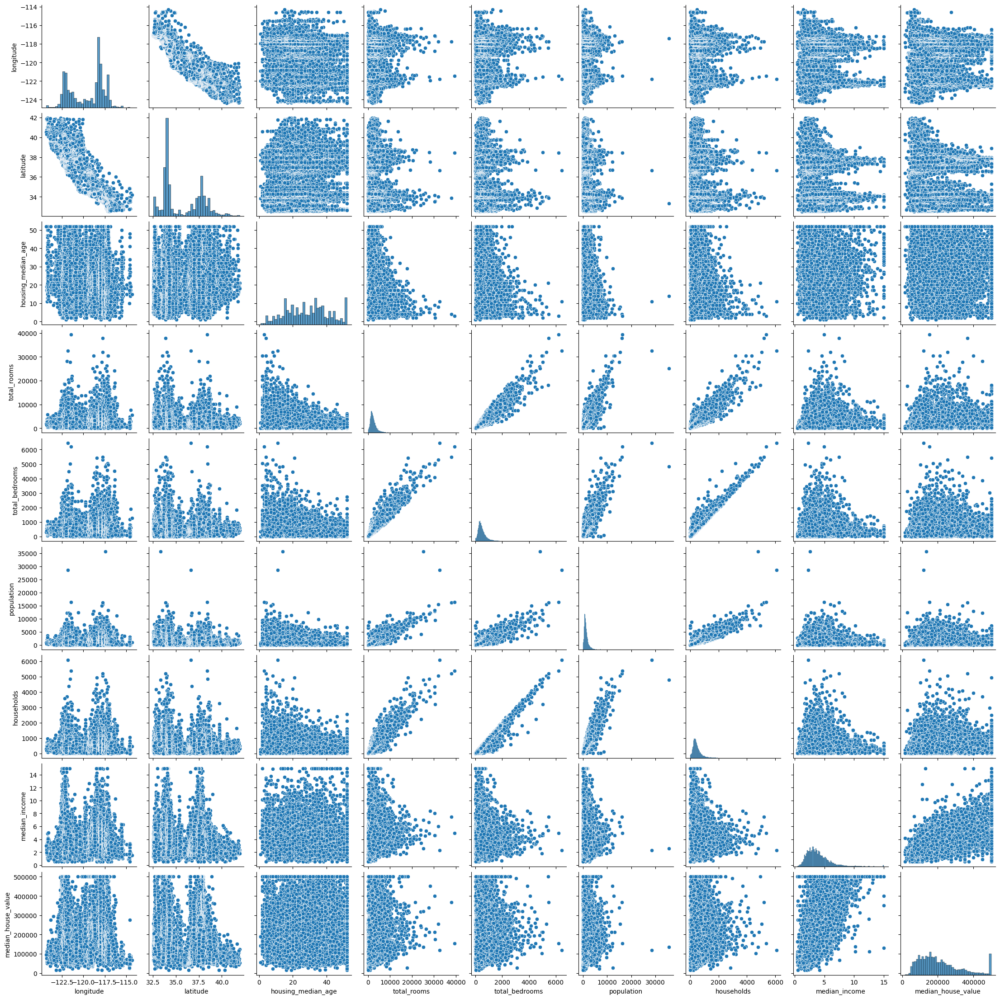

In [9]:
import seaborn as sns
sns.pairplot(df)

In [10]:
from sklearn.model_selection import train_test_split
train_set, test_set = train_test_split(df, test_size=0.2, random_state=42)
len(train_set), len(test_set)

(16512, 4128)

In [11]:
train_set.to_pickle("train_set.pkl")
test_set.to_pickle("test_set.pkl")

In [12]:
pd.options.plotting.backend = "plotly"
df.plot(kind="scatter", x="longitude", y="latitude")